In [75]:
import numpy as np
import pandas as pd
df=pd.read_csv(r"C:\Users\lenovo\OneDrive\Desktop\DataScience\Delivery.csv")
df

,market_id,created_at,actual_delivery_time,store_id,store_primary_category,order_protocol,total_items,subtotal,num_distinct_items,min_item_price,max_item_price,total_onshift_partners,total_busy_partners,total_outstanding_orders
0,1.0,2/6/2015 22:24,2/6/2015 23:27,df263d996281d984952c07998dc54358,american,1.0,4,3441,4,557,1239,33.0,14.0,21.0
1,2.0,2/10/2015 21:49,2/10/2015 22:56,f0ade77b43923b38237db569b016ba25,mexican,2.0,1,1900,1,1400,1400,1.0,2.0,2.0
2,3.0,1/22/2015 20:39,1/22/2015 21:09,f0ade77b43923b38237db569b016ba25,NaN,1.0,1,1900,1,1900,1900,1.0,0.0,0.0
3,3.0,2/3/2015 21:21,2/3/2015 22:13,f0ade77b43923b38237db569b016ba25,NaN,1.0,6,6900,5,600,1800,1.0,1.0,2.0
4,3.0,2/15/2015 2:40,2/15/2015 3:20,f0ade77b43923b38237db569b016ba25,NaN,1.0,3,3900,3,1100,1600,6.0,6.0,9.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
197423,1.0,2/17/2015 0:19,2/17/2015 1:24,a914ecef9c12ffdb9bede64bb703d877,fast,4.0,3,1389,3,345,649,17.0,17.0,23.0
197424,1.0,2/13/2015 0:01,2/13/2015 0:58,a914ecef9c12ffdb9bede64bb703d877,fast,4.0,6,3010,4,405,825,12.0,11.0,14.0
197425,1.0,1/24/2015 4:46,1/24/2015 5:36,a914ecef9c12ffdb9bede64bb703d877,fast,4.0,5,1836,3,300,399,39.0,41.0,40.0
197426,1.0,2/1/2015 18:18,2/1/2015 19:23,c81e155d85dae5430a8cee6f2242e82c,sandwich,1.0,1,1175,1,535,535,7.0,7.0,12.0


In [76]:
df["created_at"]=pd.to_datetime(df["created_at"])
df["actual_delivery_time"]=pd.to_datetime(df["actual_delivery_time"])
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 197428 entries, 0 to 197427
Data columns (total 14 columns):
 #   Column                    Non-Null Count   Dtype         
---  ------                    --------------   -----         
 0   market_id                 196441 non-null  float64       
 1   created_at                197428 non-null  datetime64[ns]
 2   actual_delivery_time      197421 non-null  datetime64[ns]
 3   store_id                  197428 non-null  object        
 4   store_primary_category    192668 non-null  object        
 5   order_protocol            196433 non-null  float64       
 6   total_items               197428 non-null  int64         
 7   subtotal                  197428 non-null  int64         
 8   num_distinct_items        197428 non-null  int64         
 9   min_item_price            197428 non-null  int64         
 10  max_item_price            197428 non-null  int64         
 11  total_onshift_partners    181166 non-null  float64       
 12  to

In [77]:
df.drop(["market_id"],inplace=True,axis=1)
df.drop(["store_id"],inplace=True,axis=1)
df.drop(["store_primary_category"],inplace=True,axis=1)
df

,created_at,actual_delivery_time,order_protocol,total_items,subtotal,num_distinct_items,min_item_price,max_item_price,total_onshift_partners,total_busy_partners,total_outstanding_orders
0,2015-02-06 22:24:00,2015-02-06 23:27:00,1.0,4,3441,4,557,1239,33.0,14.0,21.0
1,2015-02-10 21:49:00,2015-02-10 22:56:00,2.0,1,1900,1,1400,1400,1.0,2.0,2.0
2,2015-01-22 20:39:00,2015-01-22 21:09:00,1.0,1,1900,1,1900,1900,1.0,0.0,0.0
3,2015-02-03 21:21:00,2015-02-03 22:13:00,1.0,6,6900,5,600,1800,1.0,1.0,2.0
4,2015-02-15 02:40:00,2015-02-15 03:20:00,1.0,3,3900,3,1100,1600,6.0,6.0,9.0
...,...,...,...,...,...,...,...,...,...,...,...
197423,2015-02-17 00:19:00,2015-02-17 01:24:00,4.0,3,1389,3,345,649,17.0,17.0,23.0
197424,2015-02-13 00:01:00,2015-02-13 00:58:00,4.0,6,3010,4,405,825,12.0,11.0,14.0
197425,2015-01-24 04:46:00,2015-01-24 05:36:00,4.0,5,1836,3,300,399,39.0,41.0,40.0
197426,2015-02-01 18:18:00,2015-02-01 19:23:00,1.0,1,1175,1,535,535,7.0,7.0,12.0


In [78]:
df.isnull().sum()

created_at                      0
actual_delivery_time            7
order_protocol                995
total_items                     0
subtotal                        0
num_distinct_items              0
min_item_price                  0
max_item_price                  0
total_onshift_partners      16262
total_busy_partners         16262
total_outstanding_orders    16262
dtype: int64

In [79]:
from datetime import timedelta
df["created_at"]=(df["actual_delivery_time"]-df["created_at"])/timedelta(minutes=1)
df.head()

,created_at,actual_delivery_time,order_protocol,total_items,subtotal,num_distinct_items,min_item_price,max_item_price,total_onshift_partners,total_busy_partners,total_outstanding_orders
0,63.0,2015-02-06 23:27:00,1.0,4,3441,4,557,1239,33.0,14.0,21.0
1,67.0,2015-02-10 22:56:00,2.0,1,1900,1,1400,1400,1.0,2.0,2.0
2,30.0,2015-01-22 21:09:00,1.0,1,1900,1,1900,1900,1.0,0.0,0.0
3,52.0,2015-02-03 22:13:00,1.0,6,6900,5,600,1800,1.0,1.0,2.0
4,40.0,2015-02-15 03:20:00,1.0,3,3900,3,1100,1600,6.0,6.0,9.0


In [80]:
df.drop("actual_delivery_time", inplace=True, axis=1)
df = df.rename(columns={'created_at': 'delivery_time(mins)'})

In [81]:
import warnings
warnings.filterwarnings("ignore")
df.dropna(inplace=True)
df.isnull().sum()

delivery_time(mins)         0
order_protocol              0
total_items                 0
subtotal                    0
num_distinct_items          0
min_item_price              0
max_item_price              0
total_onshift_partners      0
total_busy_partners         0
total_outstanding_orders    0
dtype: int64

In [82]:
print(df.shape)
df.info()

(180242, 10)
<class 'pandas.core.frame.DataFrame'>
Int64Index: 180242 entries, 0 to 197427
Data columns (total 10 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   delivery_time(mins)       180242 non-null  float64
 1   order_protocol            180242 non-null  float64
 2   total_items               180242 non-null  int64  
 3   subtotal                  180242 non-null  int64  
 4   num_distinct_items        180242 non-null  int64  
 5   min_item_price            180242 non-null  int64  
 6   max_item_price            180242 non-null  int64  
 7   total_onshift_partners    180242 non-null  float64
 8   total_busy_partners       180242 non-null  float64
 9   total_outstanding_orders  180242 non-null  float64
dtypes: float64(5), int64(5)
memory usage: 15.1 MB


In [83]:
df["active_partners"]=df['total_onshift_partners']-df['total_busy_partners']
df = df[df >= 0].dropna()
df

,delivery_time(mins),order_protocol,total_items,subtotal,num_distinct_items,min_item_price,max_item_price,total_onshift_partners,total_busy_partners,total_outstanding_orders,active_partners
0,63.0,1.0,4,3441,4,557.0,1239,33.0,14.0,21.0,19.0
2,30.0,1.0,1,1900,1,1900.0,1900,1.0,0.0,0.0,1.0
3,52.0,1.0,6,6900,5,600.0,1800,1.0,1.0,2.0,0.0
4,40.0,1.0,3,3900,3,1100.0,1600,6.0,6.0,9.0,0.0
5,38.0,1.0,3,5000,3,1500.0,1900,2.0,2.0,2.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...
197420,56.0,3.0,3,2352,3,499.0,685,49.0,49.0,65.0,0.0
197423,65.0,4.0,3,1389,3,345.0,649,17.0,17.0,23.0,0.0
197424,57.0,4.0,6,3010,4,405.0,825,12.0,11.0,14.0,1.0
197426,65.0,1.0,1,1175,1,535.0,535,7.0,7.0,12.0,0.0


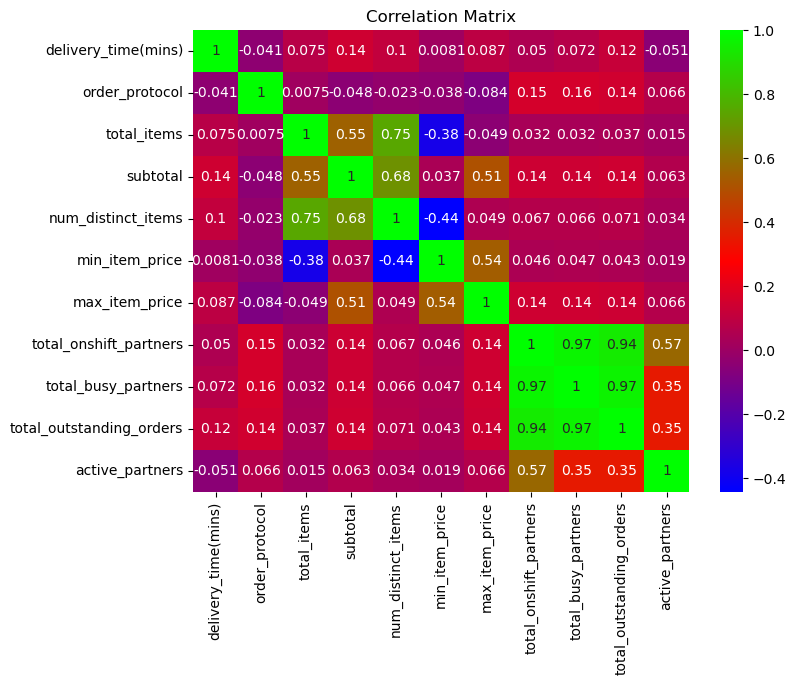

In [84]:
plt.figure(figsize=(8, 6))
import matplotlib.pyplot as plt
import seaborn as sns
sns.heatmap(df.corr(), annot=True, cmap='brg')
plt.title("Correlation Matrix")
plt.show()

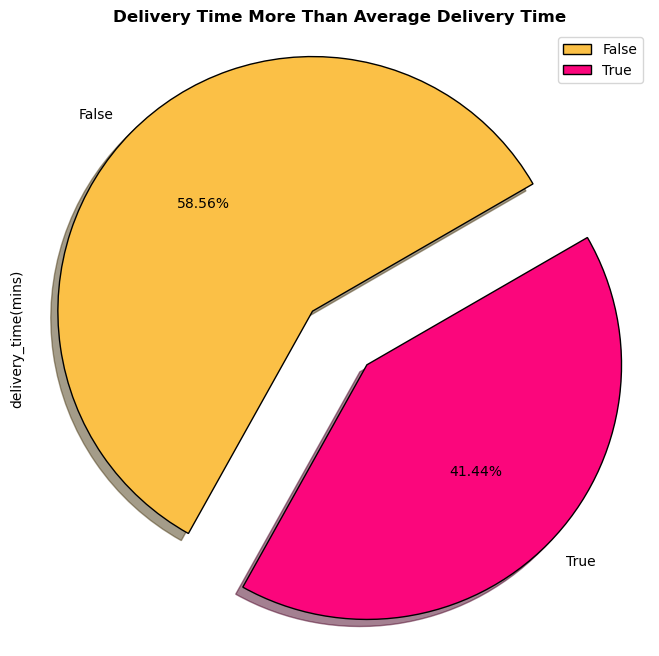

In [85]:
plt.figure(figsize=(8, 8))
avg=df['delivery_time(mins)'].mean()
(df['delivery_time(mins)']>avg).value_counts().plot(kind='pie',autopct='%1.2f%%', wedgeprops={'edgecolor':"black"},
                                                    colors=["#fbc046","#fb067c"],explode=[0.1,0.2],shadow=True,startangle=30)
plt.axis('equal')
plt.title("Delivery Time More Than Average Delivery Time", fontweight='semibold')
plt.legend()
plt.show()

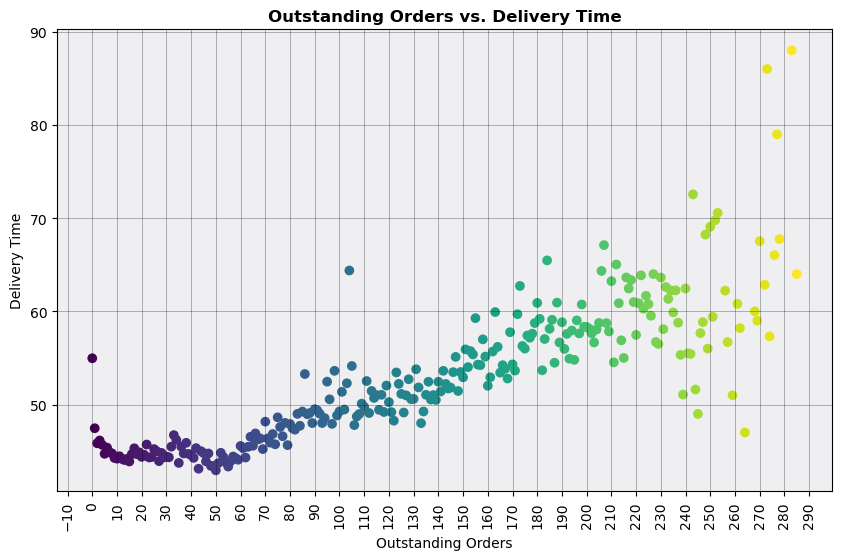

In [86]:
from matplotlib.ticker import MultipleLocator
plt.figure(figsize=(10, 6))
ax=plt.axes()
ax.set_facecolor("#EFEEF1")
plt.grid(True, alpha= 0.5, color="black", linewidth=0.4)
plt.gca().xaxis.set_major_locator(MultipleLocator(10))
plt.xticks(rotation=90)
delivery_time_by_orders = df.groupby('total_outstanding_orders')['delivery_time(mins)'].mean().reset_index()
plt.scatter(delivery_time_by_orders['total_outstanding_orders'],delivery_time_by_orders['delivery_time(mins)'], c=delivery_time_by_orders['total_outstanding_orders'])  
plt.xlabel('Outstanding Orders')
plt.ylabel('Delivery Time')
plt.title('Outstanding Orders vs. Delivery Time', fontweight='bold')
plt.show()

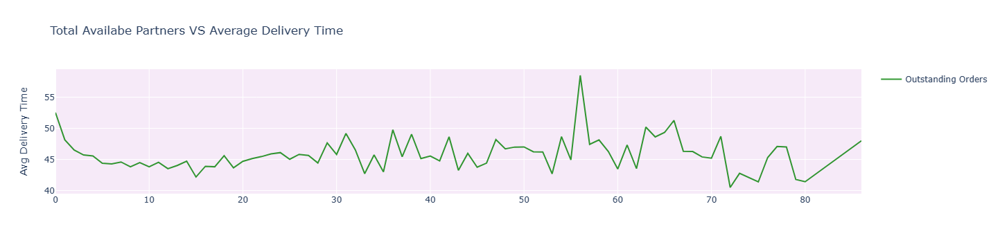

In [87]:
delivery_time_by_orders = df.groupby("active_partners")['delivery_time(mins)'].mean().reset_index()
import plotly.graph_objs as go
fig = go.Figure()
fig.add_trace(go.Scatter(
    x=delivery_time_by_orders['active_partners'],
    y=delivery_time_by_orders['delivery_time(mins)'],
    name='Outstanding Orders',
        line=dict(
        color="green",
        width=2,
        dash="solid",
    ),
    opacity=0.8
))
fig.update_layout(
    title="Total Availabe Partners VS Average Delivery Time",
    yaxis_title="Avg Delivery Time",
    showlegend=True,
    plot_bgcolor='#F6EAF8'
)

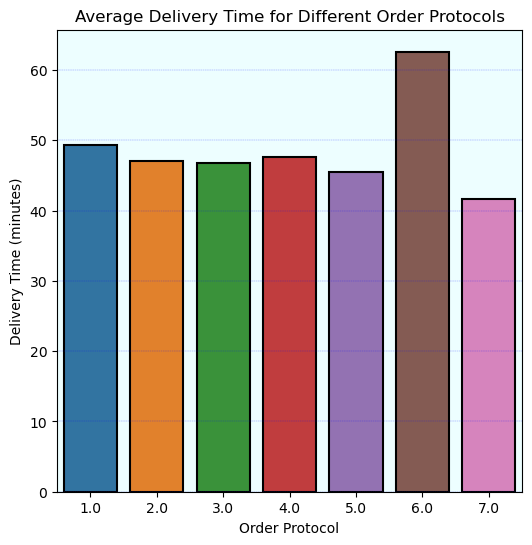

,order_protocol,delivery_time(mins)
0,1.0,49.385009
1,2.0,47.110951
2,3.0,46.752063
3,4.0,47.593899
4,5.0,45.436817
5,6.0,62.611321
6,7.0,41.647059


In [88]:
delivery_time_by_protocol = df.groupby('order_protocol')['delivery_time(mins)'].mean().reset_index()
plt.rcParams['figure.figsize']=(6,6)
ax=plt.axes()
ax.set_facecolor("#EDFEFF")
plt.grid(True, linestyle="--", alpha= 0.5, color="blue", linewidth=0.3)
sns.barplot(x='order_protocol', y='delivery_time(mins)', data=delivery_time_by_protocol,edgecolor='black', linewidth=1.5)
plt.title('Average Delivery Time for Different Order Protocols')
plt.xlabel('Order Protocol')
plt.ylabel('Delivery Time (minutes)')
plt.show()
delivery_time_by_protocol

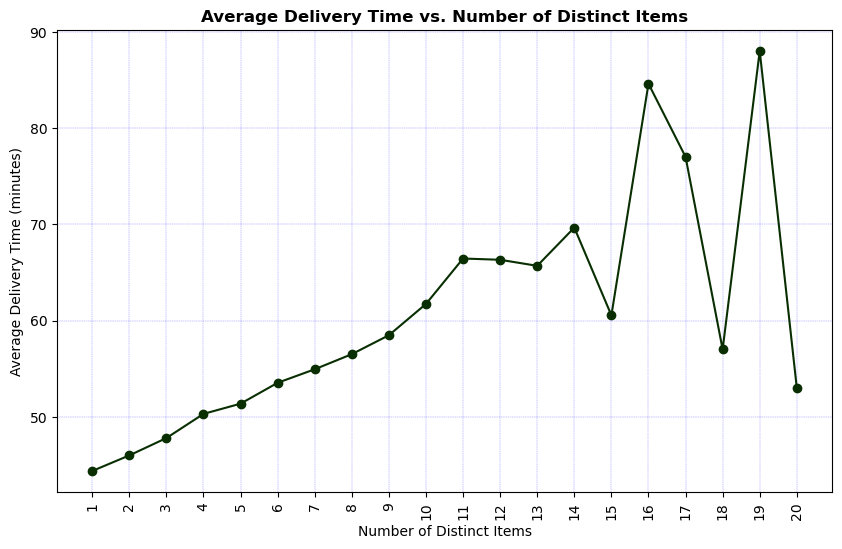

In [89]:

delivery_time_by_orders = df.groupby('num_distinct_items')['delivery_time(mins)'].mean().reset_index()
plt.figure(figsize=(10, 6))
plt.gca().xaxis.set_major_locator(MultipleLocator(1))
plt.xticks(rotation=90)
plt.plot(delivery_time_by_orders['num_distinct_items'], delivery_time_by_orders['delivery_time(mins)'], marker='o', color="#082E02")
plt.grid(True, linestyle="--", alpha= 0.5, color="blue", linewidth=0.3)
plt.xlabel('Number of Distinct Items')
plt.ylabel('Average Delivery Time (minutes)')
plt.title('Average Delivery Time vs. Number of Distinct Items', fontweight='semibold')
plt.show()

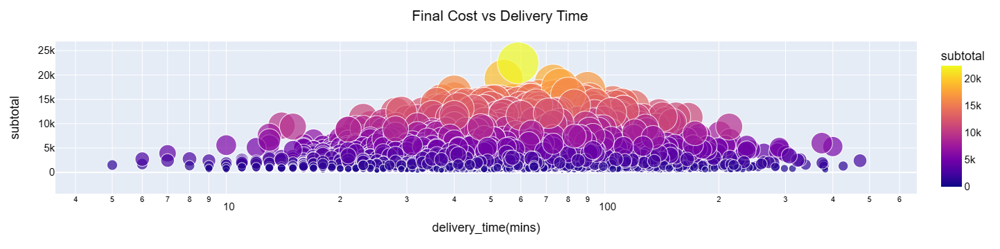

In [90]:
import plotly.express as px
fig = px.scatter(df[df["delivery_time(mins)"]<500], x="delivery_time(mins)", y="subtotal",
	         size="subtotal", color="subtotal",
                 hover_name="delivery_time(mins)", log_x=True, size_max=60)
fig.update_layout(title="Final Cost vs Delivery Time",
                  font=dict(family="Arial", size=15, color="black"), title_x=0.5)
fig.show()

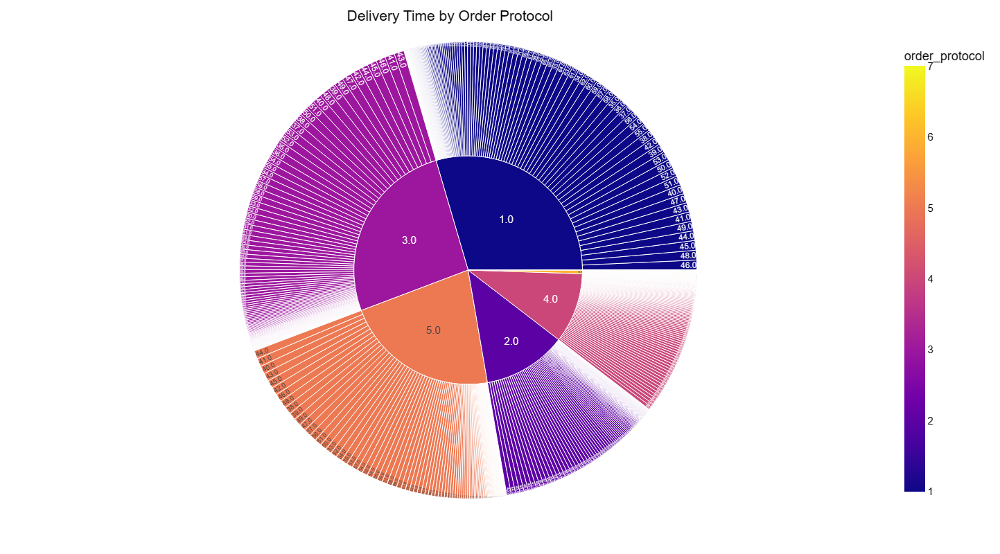

In [91]:
fig = px.sunburst(df, path=['order_protocol', 'delivery_time(mins)'], values='delivery_time(mins)',
                  color='order_protocol', hover_data=['delivery_time(mins)'], width=1000, height=800)
fig.update_layout(title='Delivery Time by Order Protocol',
                  font=dict(family="Arial", size=15, color="black"), title_x=0.45)
fig.show()


In [93]:
df.drop("min_item_price",axis=1,inplace=True)
df.drop("max_item_price",axis=1,inplace=True)

In [94]:
y=df.iloc[:,0]
x=df.iloc[:,1:]

In [95]:
from sklearn.preprocessing import MinMaxScaler
sc=MinMaxScaler()
#x=sc.fit_transform(x)
x

,order_protocol,total_items,subtotal,num_distinct_items,total_onshift_partners,total_busy_partners,total_outstanding_orders,active_partners
0,1.0,4,3441,4,33.0,14.0,21.0,19.0
2,1.0,1,1900,1,1.0,0.0,0.0,1.0
3,1.0,6,6900,5,1.0,1.0,2.0,0.0
4,1.0,3,3900,3,6.0,6.0,9.0,0.0
5,1.0,3,5000,3,2.0,2.0,2.0,0.0
...,...,...,...,...,...,...,...,...
197420,3.0,3,2352,3,49.0,49.0,65.0,0.0
197423,4.0,3,1389,3,17.0,17.0,23.0,0.0
197424,4.0,6,3010,4,12.0,11.0,14.0,1.0
197426,1.0,1,1175,1,7.0,7.0,12.0,0.0


In [96]:
import pickle
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)
model1 = LinearRegression(fit_intercept=True, n_jobs=None)
model1.fit(X_train, y_train)
print(X_train,y_train)

        order_protocol  total_items  subtotal  num_distinct_items  \
103242             1.0            6      3980                   4   
148167             1.0            1      1148                   1   
30791              1.0            4      4947                   4   
27372              3.0            3      3800                   3   
5852               3.0            1      1170                   1   
...                ...          ...       ...                 ...   
155684             4.0            1       526                   1   
169156             3.0            3      2500                   3   
146148             5.0            1      1345                   1   
186080             1.0            6      7197                   6   
172001             2.0            7      7165                   3   

        total_onshift_partners  total_busy_partners  total_outstanding_orders  \
103242                    51.0                 51.0                      97.0   
148167   

In [98]:
y_pred1=model1.predict(X_test)
print(y_test,y_pred1)

115195    74.0
157483    42.0
3380      50.0
86882     43.0
105531    44.0
          ... 
191289    40.0
148892    43.0
50652     85.0
73677     27.0
38264     54.0
Name: delivery_time(mins), Length: 28002, dtype: float64 [50.91610219 44.03469912 63.96319233 ... 48.56868619 39.12515176
 59.75708614]


In [99]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, mean_absolute_percentage_error
print("mean absolute error:",mean_absolute_error(y_test,y_pred1))
print("mean squared error:",mean_squared_error(y_test,y_pred1))
print("root mean squared error:",np.sqrt(mean_squared_error(y_test,y_pred1)))
print("r2-score:",r2_score(y_test,y_pred1))

mean absolute error: 12.017516353552027
mean squared error: 279.2507367873407
root mean squared error: 16.7107970123313
r2-score: 0.15888016936182137


In [100]:
from sklearn.linear_model import Ridge
model1 = Ridge(alpha=0.001)
model1.fit(X_train, y_train)

Ridge(alpha=0.001)

In [101]:
y_pred1=model1.predict(X_test)
print(y_test,y_pred1)

115195    74.0
157483    42.0
3380      50.0
86882     43.0
105531    44.0
          ... 
191289    40.0
148892    43.0
50652     85.0
73677     27.0
38264     54.0
Name: delivery_time(mins), Length: 28002, dtype: float64 [50.91610219 44.03469913 63.96319232 ... 48.56868618 39.12515176
 59.75708614]


In [102]:
print("mean absolute error:",mean_absolute_error(y_test,y_pred1))
print("mean squared error:",mean_squared_error(y_test,y_pred1))
print("root mean squared error:",np.sqrt(mean_squared_error(y_test,y_pred1)))
print("r2-score:",r2_score(y_test,y_pred1))

mean absolute error: 12.017516353640158
mean squared error: 279.2507367877631
root mean squared error: 16.71079701234394
r2-score: 0.15888016936054916


In [104]:
y_new=model1.predict([[1.0,3,5000,3,2.0,2.0,2.0,0.0]])
y_new

array([54.25600758])

In [105]:
from sklearn.linear_model import Lasso
model = Lasso(alpha=0.001)
model.fit(X_train, y_train)

Lasso(alpha=0.001)

In [106]:
y_pred=model.predict(X_test)
print(y_test,y_pred)

115195    74.0
157483    42.0
3380      50.0
86882     43.0
105531    44.0
          ... 
191289    40.0
148892    43.0
50652     85.0
73677     27.0
38264     54.0
Name: delivery_time(mins), Length: 28002, dtype: float64 [50.91466945 44.03601787 63.96203577 ... 48.56796346 39.124819
 59.75696649]


In [107]:
print("mean absolute error:",mean_absolute_error(y_test,y_pred))
print("mean squared error:",mean_squared_error(y_test,y_pred))
print("root mean squared error:",np.sqrt(mean_squared_error(y_test,y_pred)))
print("r2-score:",r2_score(y_test,y_pred))

mean absolute error: 12.017537244695525
mean squared error: 279.2509110354977
root mean squared error: 16.710802225970415
r2-score: 0.1588796445160071


In [108]:
# Try a different model, such as Random Forest
from sklearn.ensemble import RandomForestRegressor
model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
r2 = r2_score(y_test, y_pred)
print('R2 score1:', r2)

R2 score1: -1.4060570935504906


In [46]:
from xgboost import XGBRegressor

In [47]:
xgb_model = XGBRegressor(random_state=42, n_estimators=100, learning_rate=0.05, max_depth=10,
                             min_child_weight=1, subsample=0.8, colsample_bytree=0.7)
xgb_model.fit(X_train, y_train)
y_pred6=xgb_model.predict(X_test)
print(y_test,y_pred6)

115195    74.0
157483    42.0
3380      50.0
86882     43.0
105531    44.0
          ... 
191289    40.0
148892    43.0
50652     85.0
73677     27.0
38264     54.0
Name: delivery_time(mins), Length: 28002, dtype: float64 [67.18408  45.073765 60.31685  ... 51.542374 36.016808 55.694214]


In [48]:
print("mean absolute error:",mean_absolute_error(y_test,y_pred6))
print("mean squared error:",mean_squared_error(y_test,y_pred6))
print("root mean squared error:",np.sqrt(mean_squared_error(y_test,y_pred6)))
print("r2-score:",r2_score(y_test,y_pred6))

mean absolute error: 11.514176289087262
mean squared error: 275.6761775001263
root mean squared error: 16.603498953537663
r2-score: 0.16964695457018975


In [49]:
y_new=xgb_model.predict([[1.0,3,5000,800,3,2.0,2.0,2.0,0.0]])
y_new

array([74.06565], dtype=float32)

In [109]:
from sklearn.preprocessing import PolynomialFeatures
degree = 2
poly_features = PolynomialFeatures(degree=degree)
X_poly = poly_features.fit_transform(X_train)
X_test_poly = poly_features.fit_transform(X_test)
model_poly = LinearRegression(fit_intercept=True, n_jobs=None)
model_poly.fit(X_poly, y_train)

LinearRegression()

In [110]:
y_pred7=model_poly.predict(X_test_poly)
print(y_test,y_pred)

115195    74.0
157483    42.0
3380      50.0
86882     43.0
105531    44.0
          ... 
191289    40.0
148892    43.0
50652     85.0
73677     27.0
38264     54.0
Name: delivery_time(mins), Length: 28002, dtype: float64 [66.16       41.85633333 59.04       ... 50.92       35.44
 53.31      ]


In [111]:
print("mean absolute error:",mean_absolute_error(y_test,y_pred7))
print("mean squared error:",mean_squared_error(y_test,y_pred7))
print("root mean squared error:",np.sqrt(mean_squared_error(y_test,y_pred7)))
print("r2-score:",r2_score(y_test,y_pred7))

mean absolute error: 11.76656145057051
mean squared error: 270.14600856814417
root mean squared error: 16.43611902391024
r2-score: 0.1863041523594713


In [112]:
y_new=model_poly.predict(poly_features.transform([[1.0,3,5000,3,2.0,2.0,2.0,0.0]]))
y_new

array([57.61370327])

In [113]:
with open('modelnew.pkl', 'wb') as file:
    pickle.dump(model_poly, file)
with open('scaler.pkl', 'wb') as file:
    pickle.dump(poly_features, file)